In [12]:
%pip install tensorflow-hub --user

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.



  Using cached tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata (1.3 kB)
  Using cached tf_keras-2.17.0-py3-none-any.whl.metadata (1.6 kB)
  Using cached tensorflow-2.17.0-cp39-cp39-win_amd64.whl.metadata (3.2 kB)
  Using cached tensorflow_intel-2.17.0-cp39-cp39-win_amd64.whl.metadata (5.0 kB)
Using cached tensorflow_hub-0.16.1-py2.py3-none-any.whl (30 kB)
Using cached tf_keras-2.17.0-py3-none-any.whl (1.7 MB)
Using cached tensorflow-2.17.0-cp39-cp39-win_amd64.whl (2.0 kB)
Using cached tensorflow_intel-2.17.0-cp39-cp39-win_amd64.whl (385.0 MB)


Faster RCNN 구현

C:\Users\FOCUS\AppData\Local\Temp\ipykernel_29596\3106696691.py:28: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)  # 이미지 조정


Image downloaded to C:\Users\FOCUS\AppData\Local\Temp\tmpz7tqvuo9.jpg.
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Faster RCNN 모델 결과:
Found 100 objects.
Inference time:  30.776103019714355
Font not found, using default font.


C:\Users\FOCUS\AppData\Local\Temp\ipykernel_29596\3106696691.py:46: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
C:\Users\FOCUS\AppData\Local\Temp\ipykernel_29596\3106696691.py:55: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


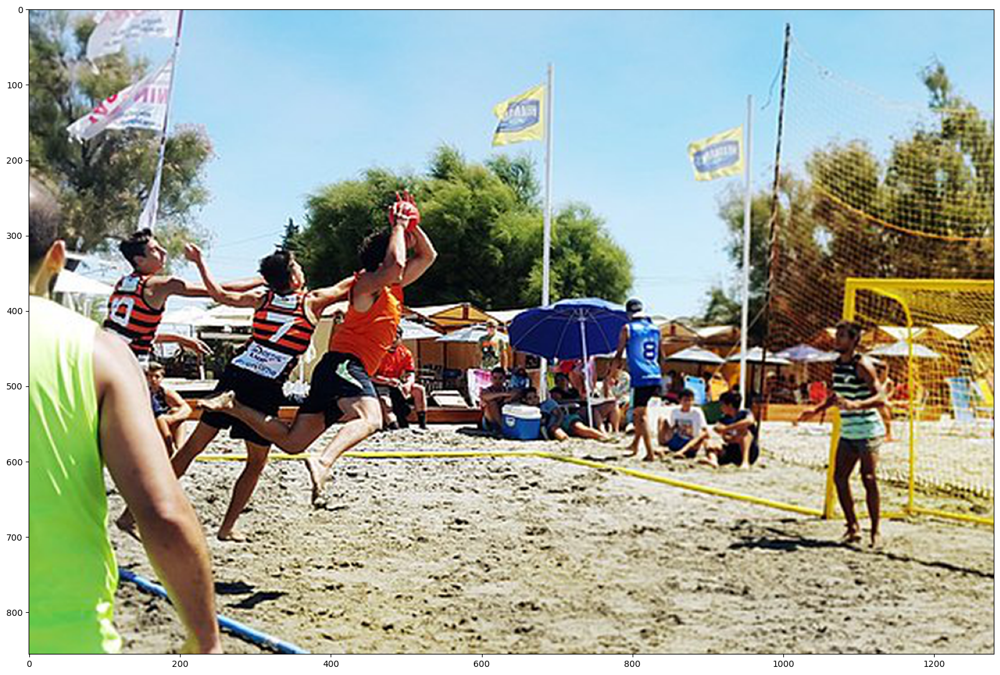

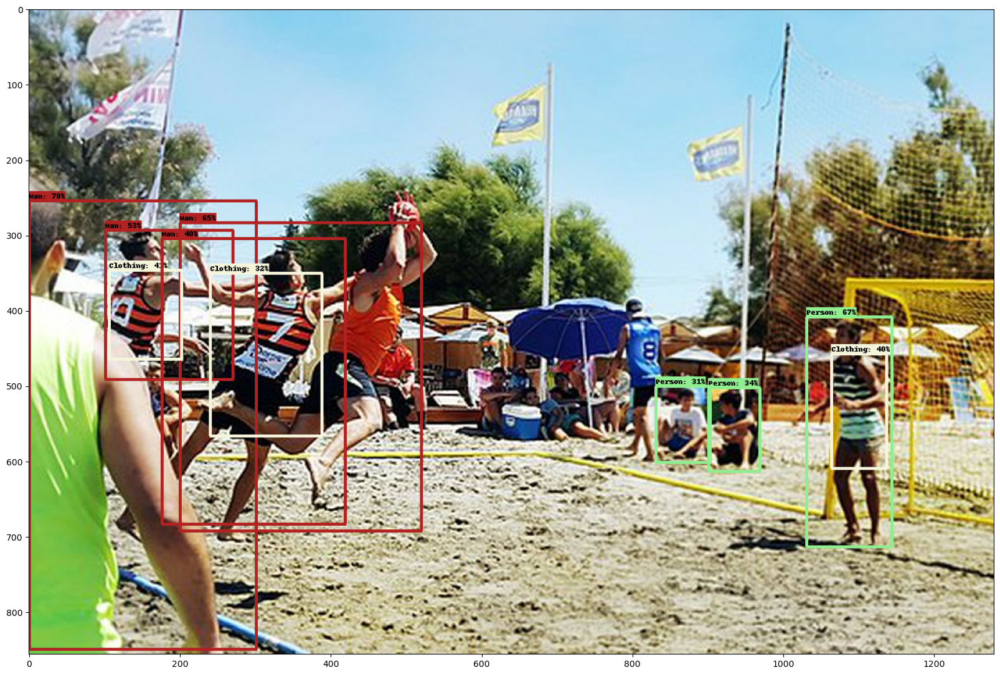

In [17]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
import time

# 이미지 출력 함수
def display_image(image):
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)

# 이미지 다운로드 및 리사이즈 함수
def download_and_resize_image(url, new_width=256, new_height=256, display=False):
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)  # 이미지 읽기
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)  # 이미지 조정
    pil_image_rgb = pil_image.convert("RGB")  # RBG로 변환
    pil_image_rgb.save(filename, format="JPEG", quality=90)  # 이미지 저장
    print("Image downloaded to %s." % filename)
    if display:
        display_image(pil_image)
    return filename

# BBox 그리기 함수
def draw_bounding_box_on_image(image, ymin, xmin, ymax, xmax, color, font, thickness=4, display_str_list=()):
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height)

    # BBox 테두리 그리기
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top), (left, top)],
              width=thickness, fill=color)

    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height

    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                        (left + text_width, text_bottom)],
                       fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str, fill="black", font=font)
        text_bottom -= text_height - 2 * margin

# BBox 그리기 함수
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf", 25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    # BBox 그리기 적용
    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
            display_str = "{}: {}%".format(class_names[i].decode("ascii"), int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(image_pil, ymin, xmin, ymax, xmax, color, font, display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

# 이미지 다운로드 및 리사이즈
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

# 기존 Faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']  # detector에 사용할 모듈 저장

def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

def run_detector(detector, path):
    img = load_img(path)
    converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

    # 소요시간 측정
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key: value.numpy() for key, value in result.items()}

    # 이미지 추론 개수와 추론 시간 출력
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time - start_time)

    # 이미지 내 박스로 entity, scores를 추가하여 출력
    image_with_boxes = draw_boxes(
        img.numpy(), result["detection_boxes"],
        result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)

# 델 실행
print("Faster RCNN 모델 결과:")
run_detector(detector, downloaded_image_path)

문제 2-1. 다른 이미지 테스트해보기  
개 이미지 한번 테스트 해봤습니다.

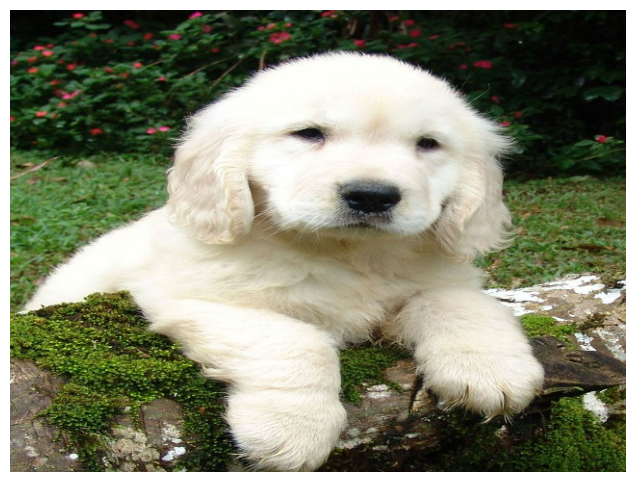

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Found 100 objects.
Inference time:  29.73468780517578


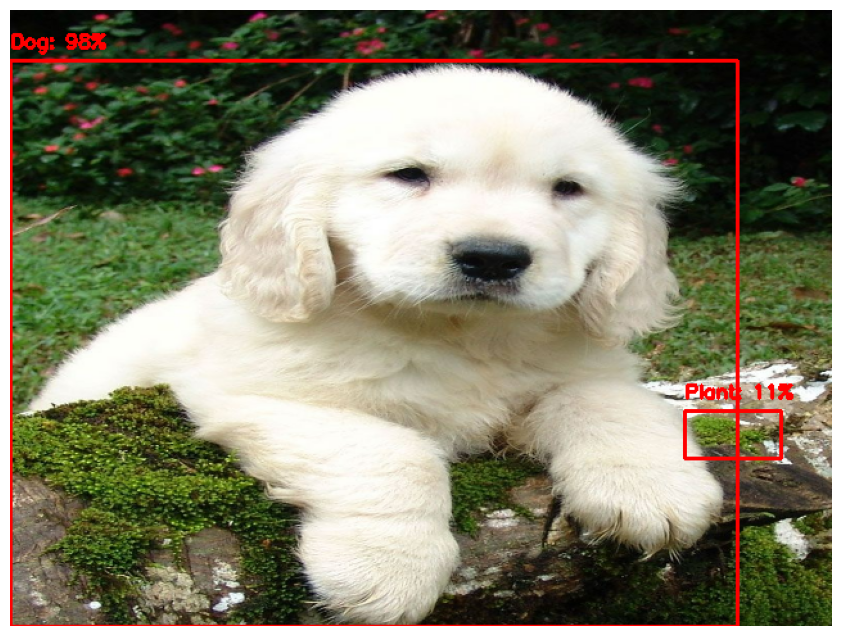

In [9]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import time
import cv2  # OpenCV 추가
from six.moves.urllib.request import urlopen

# 이미지 다운로드 및 리사이즈 함수 정의
def download_and_resize_image(url, new_width=256, new_height=256, display=False):
    try:
        response = urlopen(url)
        image_data = response.read()
        image = tf.io.decode_image(image_data, channels=3)
        image = tf.image.convert_image_dtype(image, tf.float32)
        image = tf.image.resize(image, [new_height, new_width])
        image = image[tf.newaxis, ...]  # 배치 차원 추가

        if display:
            plt.figure(figsize=(8, 6))
            plt.imshow(image[0])
            plt.axis('off')
            plt.show()

        return image
    except Exception as e:
        print(f"이미지를 다운로드하는 동안 오류가 발생했습니다: {e}")
        return None

# 이미지 다운로드 및 리사이즈
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/6e/Golde33443.jpg"  # 유효한 이미지 URL
downloaded_image = download_and_resize_image(image_url, 640, 480, True)  # 이미지를 다운로드하고 리사이즈

# 사전 학습된 Faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

# Detector 실행 함수 정의
def run_detector(detector, image):
    converted_img = tf.image.convert_image_dtype(image, tf.float32)
    
    # 소요시간 측정
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()
    
    result = {key: value.numpy() for key, value in result.items()}
    
    # 이미지 추론 개수와 추론 시간 출력
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time - start_time)
    
    # 이미지 내 박스로 entity, scores를 추가하여 출력
    image_with_boxes = draw_boxes(
        image.numpy()[0], result["detection_boxes"],
        result["detection_class_entities"], result["detection_scores"])
    
    display_image(image_with_boxes)

# 바운딩 박스를 그리는 함수 (OpenCV 사용)
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    image = np.array(image)
    height, width, _ = image.shape
    for i in range(min(len(boxes), max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = boxes[i]
            (left, right, top, bottom) = (xmin * width, xmax * width,
                                          ymin * height, ymax * height)
            class_name = class_names[i].decode("ascii")
            score = int(100 * scores[i])
            label = f"{class_name}: {score}%"

            # 바운딩 박스 그리기
            cv2.rectangle(image, (int(left), int(top)), (int(right), int(bottom)), (255, 0, 0), 2)
            # 라벨 텍스트 추가
            cv2.putText(image, label, (int(left), int(top) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    return image

# 이미지를 표시하는 함수
def display_image(image):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Detector 실행
if downloaded_image is not None:
    run_detector(detector, downloaded_image)
else:
    print("이미지 다운로드에 실패하여 객체 감지를 수행할 수 없습니다.")


문제 2-2. 다양한 pre-trained model 테스트해보기  

SSD MobileNet V2  
1번째 모델, Inception ResNet을 사용한 Faster RCNN은 정확도가 높지만 추론 시간이 상대적으로 길었습니다.  
2번째 모델, MobileNet V2를 사용한 SSD는 추론 속도가 빠르지만 정확도가 약간 떨어졌습니다.

SSD MobileNet V2 모델 결과:
Found 100 objects.
Inference time:  2.2801620960235596
Font not found, using default font.


C:\Users\FOCUS\AppData\Local\Temp\ipykernel_29596\3106696691.py:46: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
C:\Users\FOCUS\AppData\Local\Temp\ipykernel_29596\3106696691.py:55: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


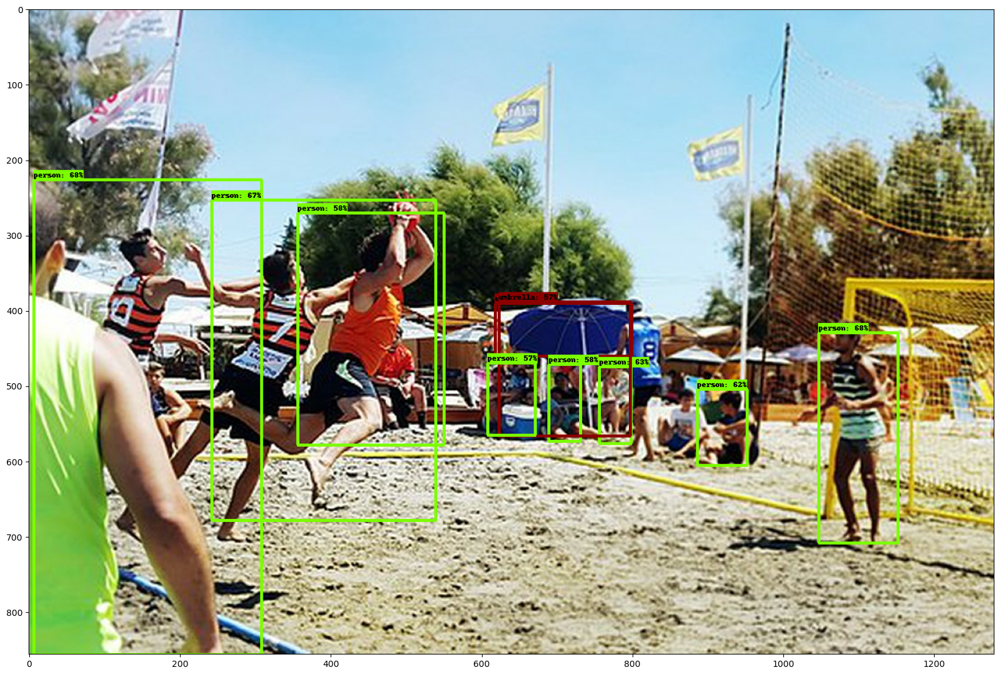

In [19]:
# 새로운 모델 불러오기
module_handle_ssd = "https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2"  # SSD MobileNet V2 모델 URL
detector_ssd = hub.load(module_handle_ssd)  # SSD Detector 로드

def get_class_names(class_ids):
    # 데이터셋 클래스 ID와 이름 매핑
    coco_labels = {
        1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane',
        6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light',
        11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench',
        16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep',
        21: 'cow', 22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe',
        27: 'backpack', 28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase',
        34: 'frisbee', 35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite',
        39: 'baseball bat', 40: 'baseball glove', 41: 'skateboard', 42: 'surfboard',
        43: 'tennis racket', 44: 'bottle', 46: 'wine glass', 47: 'cup', 48: 'fork',
        49: 'knife', 50: 'spoon', 51: 'bowl', 52: 'banana', 53: 'apple',
        54: 'sandwich', 55: 'orange', 56: 'broccoli', 57: 'carrot', 58: 'hot dog',
        59: 'pizza', 60: 'donut', 61: 'cake', 62: 'chair', 63: 'couch',
        64: 'potted plant', 65: 'bed', 67: 'dining table', 70: 'toilet',
        72: 'tv', 73: 'laptop', 74: 'mouse', 75: 'remote', 76: 'keyboard',
        77: 'cell phone', 78: 'microwave', 79: 'oven', 80: 'toaster', 81: 'sink',
        82: 'refrigerator', 84: 'book', 85: 'clock', 86: 'vase', 87: 'scissors',
        88: 'teddy bear', 89: 'hair drier', 90: 'toothbrush'
    }
    names = []
    for class_id in class_ids:
        class_id = int(class_id)
        name = coco_labels.get(class_id, 'N/A')
        names.append(name.encode('ascii'))  # draw_boxes 함수와 호환되도록 bytes로 변환
    return names

def run_detector_ssd(detector, path):
    img = load_img(path)
    converted_img = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]  # uint8로 변환

    # 소요시간 측정
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    # 결과를 numpy 배열로 변환
    result = {key: value.numpy() for key, value in result.items()}

    # 출력 결과에서 필요한 정보 추출
    detection_scores = result['detection_scores'][0]
    detection_boxes = result['detection_boxes'][0]
    detection_classes = result['detection_classes'][0]

    # 최소 점수 기준 이상인 객체만 선택
    min_score = 0.1
    indices = detection_scores >= min_score
    detection_scores = detection_scores[indices]
    detection_boxes = detection_boxes[indices]
    detection_classes = detection_classes[indices]

    # 이미지 추론 개수와 추론 시간 출력
    print("Found %d objects." % len(detection_scores))
    print("Inference time: ", end_time - start_time)

    # 클래스 이름 얻기
    class_names = get_class_names(detection_classes)

    # 이미지 내 박스로 entity, scores를 추가하여 출력
    image_with_boxes = draw_boxes(
        img.numpy(), detection_boxes,
        class_names, detection_scores)

    display_image(image_with_boxes)

# 새로운 모델 실행
print("SSD MobileNet V2 모델 결과:")
run_detector_ssd(detector_ssd, downloaded_image_path)
